# Imports

In [1]:
import pandas as pd
import requests
from ipywidgets import interact
from bs4 import BeautifulSoup
from collections import defaultdict
from pandas import DataFrame

# Task Descriptions (you can delete the description cell if you want)

## ．Target websit : <a href='https://www.gamer.com.tw/'>巴哈姆特</a>

<pre style="font-family: Arial; font-size: 18px">
．Task : 

　　1.  Find the top 20 hotboard (熱門看版) on the home page of 巴哈姆特.
  
　　2.  Enter each page, find out all articles that have more than 5 GP in the first page of 文章列表.
  
　　3.  Store the <span style="color: red">required information</span> of each article in a dataframe.
　　　　(Since there are 20 hotboards, you might have 20 dataframes as the result.)
    
　　4.  Create a interactive jupyter notebook cell to display the results of your web scraping.


．Final display format (mandatory): 

　　1.  The columns of each dataframe should be [ 'GP', '子版', '標題', '顯示內文' ]
　　
　　2.  Each dataframe should be sorted by the GP of each row (article) in a descending order.

　　3.  The index of the dataframe should start from 0 in a ascending order.

　　4.  The 標題 of each article should be display as a <span style="color: blue">hypertext</span> which linked to the source page of the article.
</pre>

# Home page of 巴哈姆特

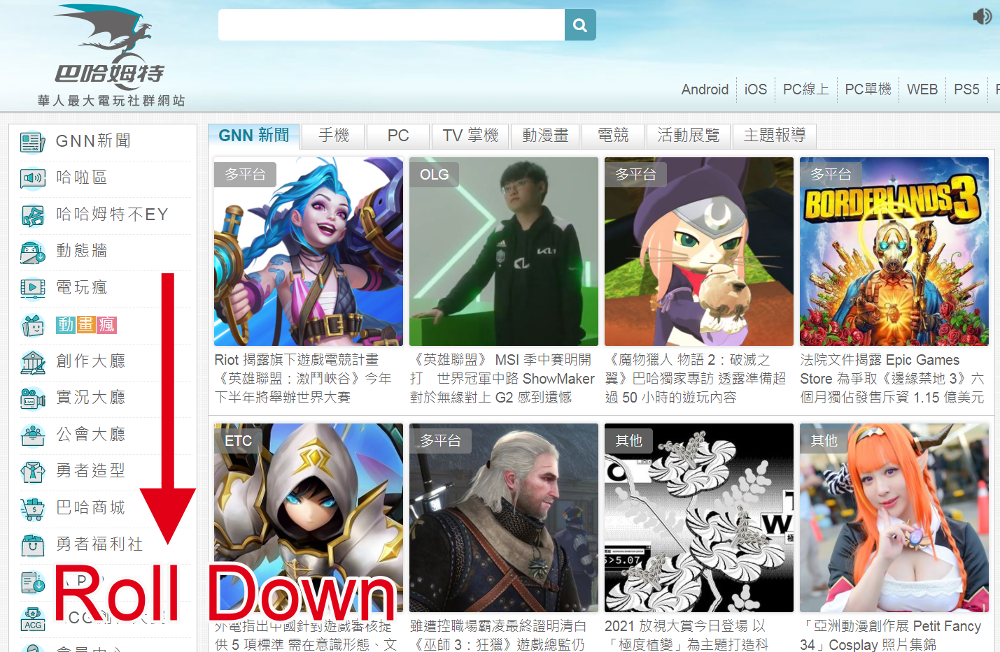

# Roll down to find the top 20 hot-board

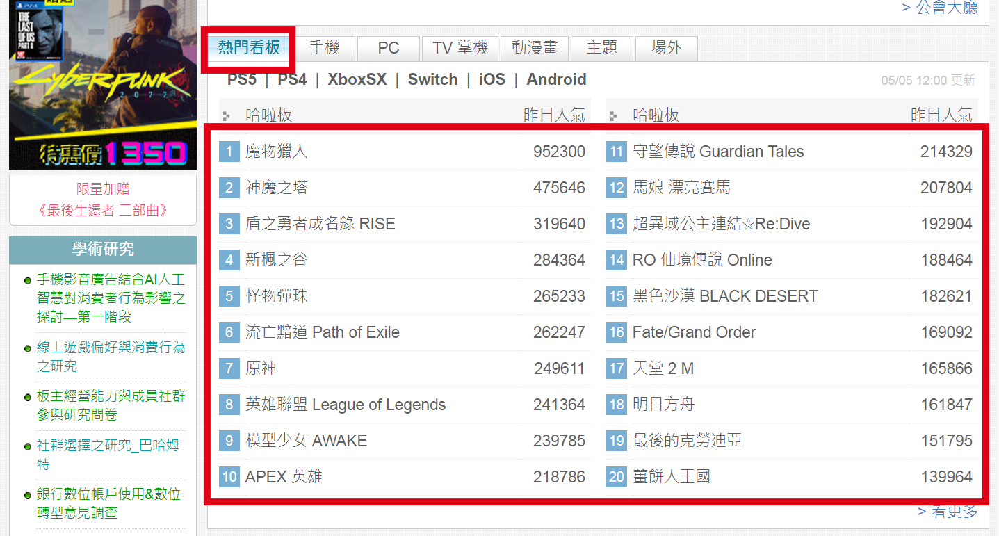

# Enter the 文章列表 of each hot-board, and find all required information

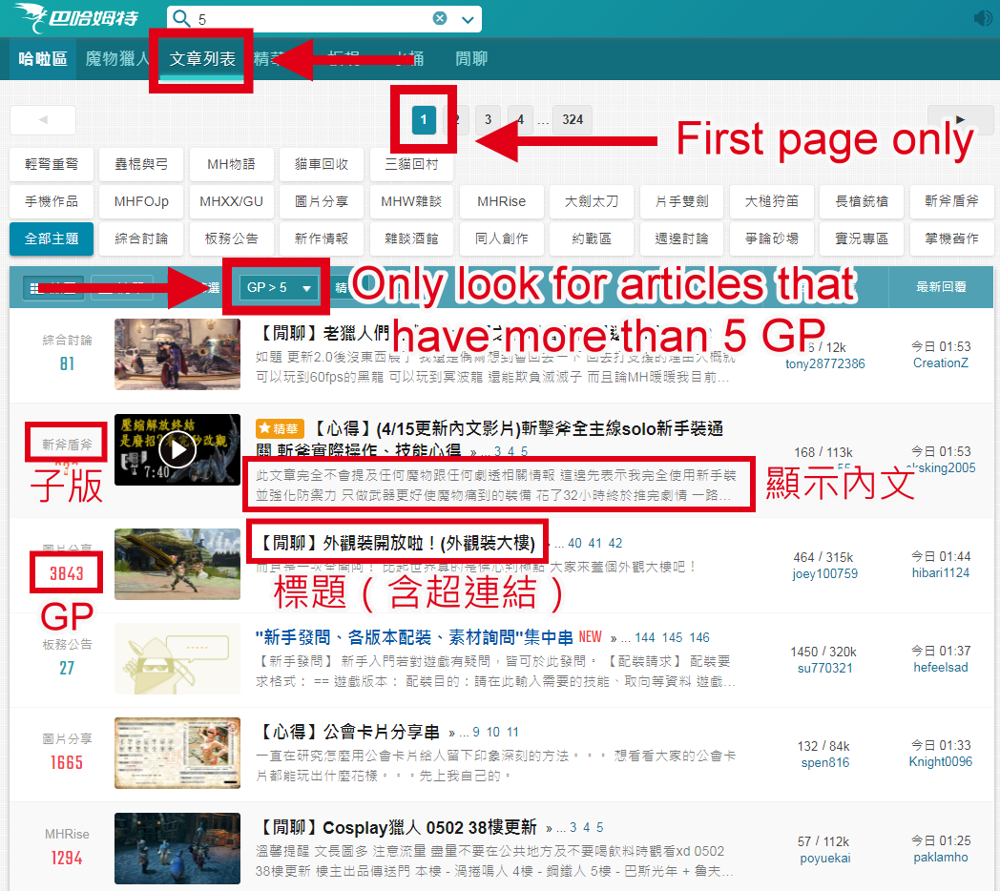

# Don't panic, this task can be done by less than 50 lines of code.
# The result should looks like follow:

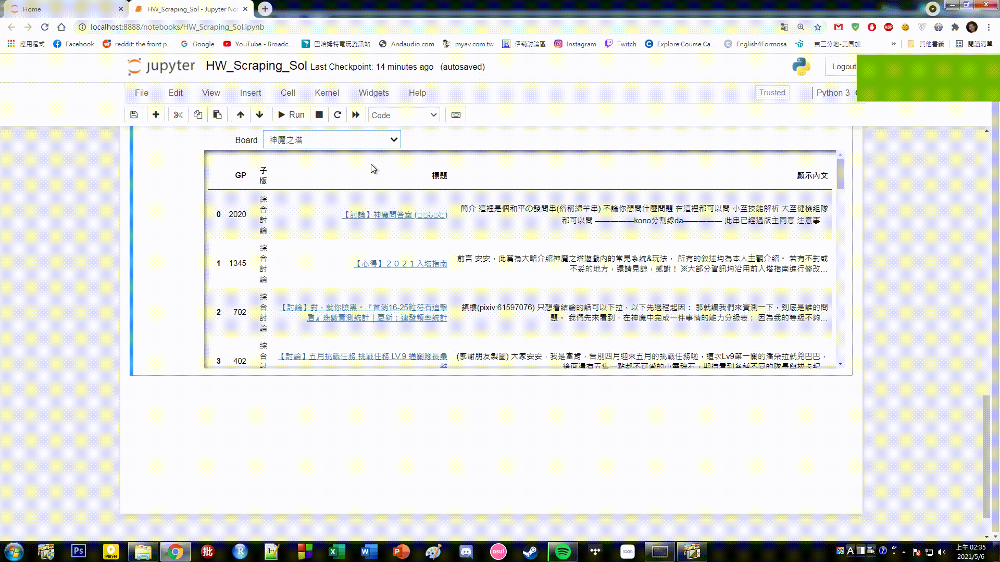

# Task

In [2]:
url_baha= 'https://www.gamer.com.tw/'
my_headers = {'user-agent': 'anything'}     
response = requests.get(url_baha, headers = my_headers).text
html=BeautifulSoup(response)

In [3]:
hotboard=html.find("div",id="hotboard")
top_20=hotboard.find_all("p",class_="BA-cbox5B")

In [4]:
game_name_list=[]
game_url_list=[]
for single_game in top_20:
    game_area = single_game.find("a")
    game_name_list.append(game_area.string)
    urll=game_area["href"].replace("A","B")
    game_url="https:"+urll+"&qt=4&q=5"
    game_url_list.append(game_url)
game_dict={}
for i in range(len(game_name_list)):
    game_dict[game_name_list[i]]=game_url_list[i]

In [5]:
def make_clickable(val):
    # target _blank to open new window
    return '<a target="_blank" href="{}">{}</a>'.format(val[1], val[0])

In [6]:
def get_game_info(Board):
    my_headers2 = {'user-agent': 'anything'}     
    response2 = requests.get(Board, headers = my_headers2).text
    html2=BeautifulSoup(response2) 
    articles=html2.find_all("tr",class_="b-list__row b-list-item b-imglist-item")
    sub_title=[]
    article_gp=[]
    title_url=[]
    title_name=[]
    content=[]
    for article in articles:
        sub_title.append(article.find("p",class_="b-list__summary__sort").string)
        article_gp.append(article.find("span").string)
        title=article.find("p",class_="b-list__main__title")
        title_url='https://forum.gamer.com.tw/'+title["href"]
        title_name.append([title.string,title_url])
        
        content.append(article.find("p",class_="b-list__brief").string)
    df=pd.DataFrame({
        'GP':article_gp,
        '子版':sub_title,
        '標題':title_name,
        '顯示內文':content
    })
    return df.style.format({'標題':make_clickable})

In [7]:
interact(get_game_info,Board=game_dict)

interactive(children=(Dropdown(description='Board', options={'新楓之谷 ': 'https://forum.gamer.com.tw/B.php?bsn=76…

<function __main__.get_game_info(Board)>